# Image Classification

In this project, we built a convolutional neural network that can predict
whether two shoes are from the **same pair** or from two **different pairs**.
This kind of application can have real-world applications: for example to help
people who are visually impaired to have more independence.

We explored two convolutional architectures.

In [ ]:
import pandas
import numpy as np
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.optim as optim
import sys
from PIL import Image


def reload_functions():
  if 'ML_DL_Functions3' in sys.modules:
    del sys.modules['ML_DL_Functions3']
  functions_path = drive_path.replace(" ","\ ") + 'ML_DL_Functions3.py'
  !cp $functions_path .

## 1. Data

Download the data from the link attached. Make sure you have both the python functions file and the dataset data directory on the same directory in your google drive.

Unzip the file. There are three
Main folders: `train`, `test_w` and `test_m`. Data in `train` is used for training and validation, and the data in the other folders is used for testing.
The dataset is comprised of triplets of pairs, where each such triplet of image pairs was taken in a similar setting (by the same person).

We've separated `test_w` and `test_m` so that we can track our model performance
for women's shoes and men's shoes separately. Each of the test sets contain images of either exclusively men's shoes or women's
shoes.

Upload this data to Google Colab.
Then, mount Google Drive from your Google Colab notebook:

In [ ]:
from google.colab import drive
drive_path = '/content/gdrive/MyDrive/Machine Learning/image_classification/' # TODO - UPDATE ME!
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


### 1.1 Loading and Preprocessing the data

Load the training and test data, and separate the training data into training and validation.
The numpy arrays `train_data`, `valid_data`, `test_w` and `test_m`, all of which should
be of shape `[*, 3, 2, 224, 224, 3]`. The dimensions of these numpy arrays are as follows:

- `*` - the number of triplets allocated to train, valid, or test
- `3` - the 3 pairs of shoe images in that triplet
- `2` - the left/right shoes
- `224` - the height of each image
- `224` - the width of each image
- `3` - the colour channels

So, the item `train_data[4,0,0,:,:,:]` should give us the left shoe of the first image of the fifth person.The item `train_data[4,0,1,:,:,:]`  should be the right shoe in the same pair.
The item `train_data[4,1,1,:,:,:]`  should be the right shoe in a different pair of that same person.

When first load the images using (for example) `Image.open`, you may see a numpy array of shape
`[224, 224, 4]` instead of `[224, 224, 3]`. That last channel is what's called the alpha channel for transparent
pixels, and should be removed.
**The pixel intensities are stored as an integer between 0 and 255.
We normlized our images, namely, divided the intensities by 255 so that we have floating-point values between 0 and 1.** Then, subtract 0.5
so that the elements of `train_data`, `valid_data` and `test_data` are between -0.5 and 0.5.


In [ ]:
import glob


def process_images_from_folder(path):
  images = {}
  for file in glob.glob(path):
      filename = file.split("/")[-1]            # get the name of the .jpg file
      img = np.asarray(Image.open(file))        # read the image as a numpy arrayj
      img = img[:, :, :3]                       # remove the alpha channel
      img = img / 255.0                         # Normalize pixel intensities
      img = img - 0.5                           # Subtract 0.5
      images[filename] = img                    # append to dict

  images = dict(sorted(images.items()))         # sort by lexicographic order of keys

  images_list = list(images.values())
  pairs = [images_list[i:i+2] for i in range(0, len(images_list), 2)]
  triplets = [pairs[i:i+3] for i in range(0, len(pairs), 3)]
  triplets_array = np.asarray(triplets)

  return triplets_array


path = drive_path + "data/train/*.jpg"
train_data = process_images_from_folder(path)
#N = 100
N = int(0.9 * train_data.shape[0])
valid_data = train_data[N:]
train_data = train_data[:N]

path = drive_path + "data/test_m/*.jpg"
test_m_data = process_images_from_folder(path)

path = drive_path + "data/test_w/*.jpg"
test_w_data = process_images_from_folder(path)


print(f'train_data shape: {train_data.shape}')
print(f'valid_data shape: {valid_data.shape}')
print(f'test_m_data shape: {test_m_data.shape}')
print(f'test_w_data shape: {test_w_data.shape}')



train_data shape: (101, 3, 2, 224, 224, 3)
valid_data shape: (12, 3, 2, 224, 224, 3)
test_m_data shape: (10, 3, 2, 224, 224, 3)
test_w_data shape: (10, 3, 2, 224, 224, 3)


### Data preprocessing validation:
1. Display the three pairs for the first five people.
2. Preprocessing validation test for three specific shoes.

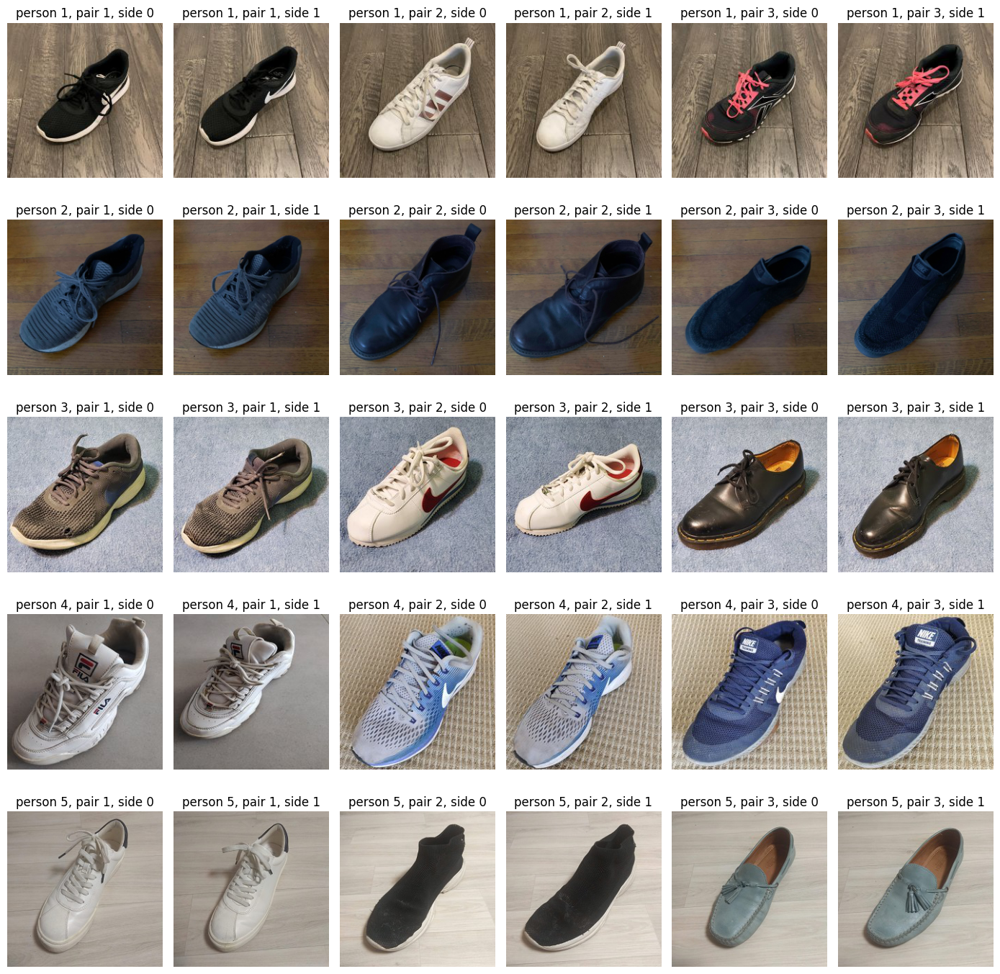

In [ ]:
fig, axes = plt.subplots(5, 6, figsize=(14, 14))
axes = axes.flatten()
count = -1
for i in range(5):
  for j in range(3):
    for k in range(2):
      if count == 30:
        break
      count = count + 1
      axes[count].imshow(train_data[i,j,k,:,:,:] + 0.5)
      axes[count].axis('off')
      axes[count].set_title(f'person {i+1}, pair {j+1}, side {k}')

plt.tight_layout()
plt.show()


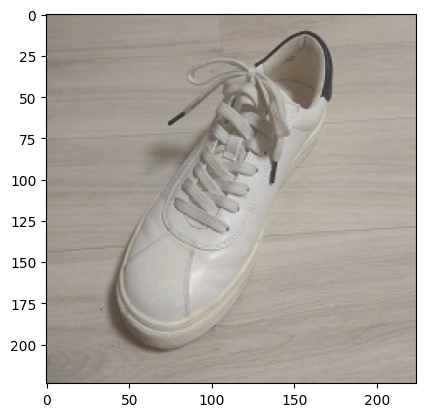

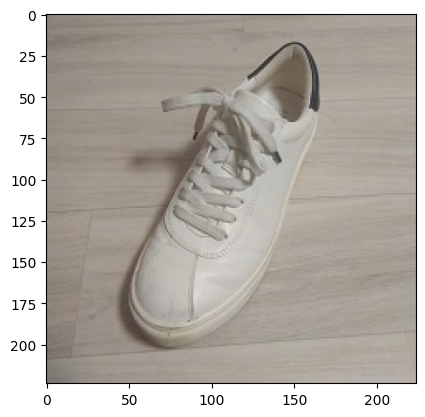

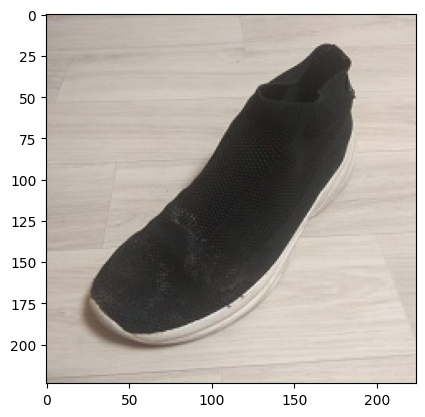

In [ ]:
test1 = np.load(drive_path+"data/preproccessing_validation/preproccessing_validation_test1.npy")
test2 = np.load(drive_path+"data/preproccessing_validation/preproccessing_validation_test2.npy")
test3 = np.load(drive_path+"data/preproccessing_validation/preproccessing_validation_test3.npy")
if (test1 != train_data[4,0,0,:,:,:]).any() or \
   (test2 != train_data[4,0,1,:,:,:]).any() or \
   (test3 != train_data[4,1,1,:,:,:]).any():
   print("preprocessing error, make sure you followed all instructions carefully")


plt.figure()
plt.imshow(train_data[4,0,0,:,:,:]+0.5) # left shoe of first pair submitted by 5th student
plt.figure()
plt.imshow(train_data[4,0,1,:,:,:]+0.5) # right shoe of first pair submitted by 5th student
plt.figure()
plt.imshow(train_data[4,1,1,:,:,:]+0.5) # right shoe of second pair submitted by 5th student

### 1.2 Generating Same Pairs

Since we want to train a model that determines whether two shoes come from the **same**
pair or **different** pairs, we need to create some labelled training data.
Our model takes in an image, either consisting of two shoes from the **same pair**
or from **different pairs**. So, we need to generate some *positive examples* with
images containing two shoes that *are* from the same pair, and some *negative examples* where
images containing two shoes that *are not* from the same pair.
We generate the *positive examples* in this part, and the *negative examples* in the next part.

The function `generate_same_pair()` takes one of the data sets that produced
in part (a), and generates a numpy array where each pair of shoes in the data set is
concatenated together. In particular, we are concatenating together images of left
and right shoes along the **height** axis. The function `generate_same_pair`
return a  numpy array of shape `[*, 448, 224, 3]`.

While at this stage we are working with numpy arrays, later on, we will convert this numpy array into a PyTorch tensor with shape
`[*, 3, 448, 224]`. For now, we keep the RGB channel as the last dimension since
that's what `plt.imshow` requires.

(101, 3, 2, 224, 224, 3)
(303, 448, 224, 3)


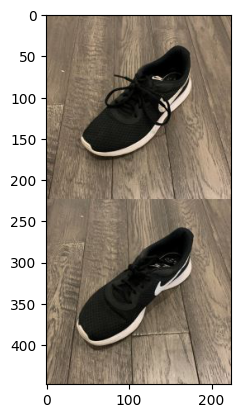

In [ ]:
def generate_same_pair(data_set):
  N = data_set.shape[0]
  pairs = []
  for i in range(N):
    for j in range(3):
      pairs.append(np.concatenate((data_set[i, j, 0, :, :, :], data_set[i, j, 1, :, :, :])))

  pairs_array = np.asarray(pairs)
  return pairs_array


print(train_data.shape) # if this is [N, 3, 2, 224, 224, 3]
print(generate_same_pair(train_data).shape) # should be [N*3, 448, 224, 3]
plt.imshow(generate_same_pair(train_data)[0]+0.5) # should show 2 shoes from the same pair

### 1.3 Generate Different Pairs

The function `generate_different_pair()` takes one of the data sets that
produced in part (a), and generates a numpy array in the same shape as part (b).
However, each image contains 2 shoes from a **different** pair, but submitted
by the **same person**. We do this by jumbling the 3 pairs of shoes submitted by
each person.

Theoretically, for each person (triplet of pairs), there are 6 different combinations
of "wrong pairs" that we could produce. To keep our data set *balanced*, we
only produced **three** combinations of wrong pairs per unique person.
In other words,`generate_same_pairs` and `generate_different_pairs`
return the same number of training examples.

(101, 3, 2, 224, 224, 3)
(303, 448, 224, 3)


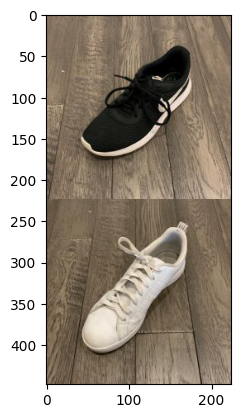

In [ ]:
def generate_different_pair(data_set, random_comb=False):
  N = data_set.shape[0]
  pairs = []

  # produce 6 different combinations of wrong pairs
  for i in range(N):
    combinations = [[], [], []]
    combinations[0].append(np.concatenate((data_set[i, 0, 0, :, :, :], data_set[i, 1, 1, :, :, :])))
    combinations[0].append(np.concatenate((data_set[i, 1, 0, :, :, :], data_set[i, 0, 1, :, :, :])))

    combinations[1].append(np.concatenate((data_set[i, 0, 0, :, :, :], data_set[i, 2, 1, :, :, :])))
    combinations[1].append(np.concatenate((data_set[i, 2, 0, :, :, :], data_set[i, 0, 1, :, :, :])))

    combinations[2].append(np.concatenate((data_set[i, 1, 0, :, :, :], data_set[i, 2, 1, :, :, :])))
    combinations[2].append(np.concatenate((data_set[i, 2, 0, :, :, :], data_set[i, 1, 1, :, :, :])))

    # choose 1 random pair from each combination couple
    for i in range(3):
      if random_comb:
        reindex = np.random.permutation(len(combinations[i]))
        pairs.append(combinations[i][reindex[0]])
      else:
        pairs.append(combinations[i][0])

  pairs_array = np.asarray(pairs)
  return pairs_array

print(train_data.shape) # if this is [N, 3, 2, 224, 224, 3]
print(generate_different_pair(train_data).shape) # should be [N*3, 448, 224, 3]
plt.imshow(generate_different_pair(train_data)[0]+0.5) # should show 2 shoes from different pairs

#### Note

In the different pairs of shoes generation, we ensure that each pair of shoes comes from the same person. This guarantees that both shoes share the same background, making the shoes themselves the only difference between the images.


## 2. Convolutional Neural Networks

In this section, we built two CNN models in PyTorch.



### 2.1 Convolutional Model

In the functions file (ML_DL_Functions3.py) implemented a CNN model in PyTorch called `CNN` that takes images of size
$3 \times 448 \times 224$, and classify whether the images contain shoes from
the same pair or from different pairs.

The model contain the following layers (n=12):

- A convolution layer that takes in 3 channels, and outputs $n$ channels.
- A $2 \times 2$ downsampling (either using a strided convolution in the previous step, or max pooling)
- A second convolution layer that takes in $n$ channels, and outputs $2\cdot n$ channels.
- A $2 \times 2$ downsampling (either using a strided convolution in the previous step, or max pooling)
- A third convolution layer that takes in $2\cdot n$ channels, and outputs $4\cdot n$ channels.
- A $2 \times 2$ downsampling (either using a strided convolution in the previous step, or max pooling)
- A fourth convolution layer that takes in $4\cdot n$ channels, and outputs $8\cdot n$ channels.
- A $2 \times 2$ downsampling (either using a strided convolution in the previous step, or max pooling)
- A fully-connected layer with 100 hidden units
- A fully-connected layer with 2 hidden units


The output of the model has a shape of (N,2) where N is the batch_size.

### 2.2 Channeled Convolutional Neural Network

In the functions file (ML_DL_Functions3.py) implemented a CNN model in PyTorch called `CNNChannel` that contains the same layers as in the Part (a), but with one crucial difference: instead of starting with an image of shape $3 \times 448 \times 224$, we first manipulate the image so that the
left and right shoes images are concatenated along the **channel** dimension. Accordingly, the input to the first convolutional layer
have 6 channels instead of 3 (input shape $6 \times 224 \times 224$).

<img src="https://drive.google.com/uc?id=1B59VE43X-6Dw3ag-9Ndn6vPEzbnFem8K" width="400px" />


The layers architecture is similar to the architecture in the CNN model.
The output of the model has a shape of (N,2) where N is the batch_size.

#### Food for thought

The two models are quite similar, and have almost the same number of parameters.
However, the `CNNChannel` perform better, showing the impact of architecture choices.

### 2.3 Get Accuracy

The function `get_accuracy` separately compute the model accuracy on the positive and negative samples.

In [ ]:
def get_accuracy(model, data, batch_size=50,device='cpu'):
    """Compute the model accuracy on the data set. This function returns two
    separate values: the model accuracy on the positive samples,
    and the model accuracy on the negative samples.

    Example Usage:

    >>> model = CNN() # create untrained model
    >>> pos_acc, neg_acc= get_accuracy(model, valid_data)
    >>> false_positive = 1 - pos_acc
    >>> false_negative = 1 - neg_acc
    """

    model.eval()
    n = data.shape[0]

    data_pos = generate_same_pair(data)      # should have shape [n * 3, 448, 224, 3]
    data_neg = generate_different_pair(data) # should have shape [n * 3, 448, 224, 3]

    pos_correct = 0
    for i in range(0, len(data_pos), batch_size):
        xs = torch.Tensor(data_pos[i:i+batch_size]).permute(0,3,1,2)
        xs = xs.to(device)
        zs = model(xs)
        pred = zs.max(1, keepdim=True)[1] # get the index of the max logit
        pred = pred.detach().cpu().numpy()
        pos_correct += (pred == 1).sum()

    neg_correct = 0
    for i in range(0, len(data_neg), batch_size):
        xs = torch.Tensor(data_neg[i:i+batch_size]).permute(0,3,1,2)
        xs = xs.to(device)
        zs = model(xs)
        pred = zs.max(1, keepdim=True)[1] # get the index of the max logit
        pred = pred.detach().cpu().numpy()
        neg_correct += (pred == 0).sum()

    return pos_correct / (n * 3), neg_correct / (n * 3)

#### Note
**False Positives:** If the model incorrectly predicts that two different shoes are from the same pair, this could lead to a visually impaired person mistakenly selecting mismatched shoes, which could cause discomfort, embarrassment, or even safety concerns.

**False Negatives:** If the model incorrectly predicts that two shoes from the same pair are different, it could result in unnecessary confusion or frustration for the user.


In my opinion, minimizing false positives might be more important because the consequences of wearing mismatched shoes could be more problematic than missing out on a correct pair.

## 3. Training

Although our task is a binary classification problem, we still use the architecture of a multi-class classification problem. That is, we use a one-hot vector to represent
our target. We also use `CrossEntropyLoss` instead of
`BCEWithLogitsLoss` (this is a standard practice in machine learning because this architecture often performs better).

### 3.1 train model

The function `train_model` takes in (as parameters) the model, training data,validation data, and other hyperparameters like the batch size, weight decay, etc.

Since our positive (shoes of the same pair) and negative (shoes of different pairs) training sets are separate, it is actually easier for us to generate separate minibatches of positive and negative training data.
 In each iteration, we take `batch_size / 2` positive samples and `batch_size / 2` negative samples. We also generate labels of 1's for the positive samples, and 0's for the negative samples.

The training function includes:

- main training loop; loss function; optimizer
- obtaining the positive and negative samples
- shuffling the positive and negative samples at the start of each epoch
- in each iteration, it takes `batch_size / 2` positive samples and `batch_size / 2` negative samples  as the input for this batch
- in each iteration, it takes `np.ones(batch_size / 2)` as the labels for the positive samples, and `np.zeros(batch_size / 2)` as the labels for the negative samples
- conversion from numpy arrays to PyTorch tensors, with input dimensions $N \times C \times H \times W$ (known as NCHW tensor), where $N$ is the number of images batch size, $C$ is the number of channels, $H$ is the height of the image, and $W$ is the width of the image.
- computing the forward and backward passes
- after every epoch, it reports the accuracies for the training set and validation set
- tracking the training curve information and plotting the training curve

It is also recommended to checkpoint your model (save a copy) after every epoch.

In [ ]:
def train_model(model,
                train_data=train_data,
                validation_data=valid_data,
                batch_size=60,
                learning_rate=1e-03,
                weight_decay=1e-05,
                epochs=20,
                checkpoint_path=drive_path+"checkpoints/",
                device='cpu',
                model_name="model",
                aug=True,
                step_size=1,
                gamma=0.98,
                random_comb=False):

  val_acc_list = []
  train_acc_list = []
  loss_list = []
  best_accuracy = 0
  early_stop_thresh = 10

  if not torch.cuda.is_available():
    device = 'cpu'

  # Initialize Loss function and optimizer
  criterion = torch.nn.CrossEntropyLoss() # The input given through a forward call is expected to contain log-probabilities of each class.
  optimizer = optim.Adam(params=model.parameters(), lr=learning_rate, weight_decay=weight_decay)
  scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=step_size, gamma=gamma)

  # Create the positive pairs
  train_pos_pairs = generate_same_pair(train_data)

  for epoch in range(epochs):
    # Create the negative pairs (generate different combinations each epoch -> diverse data)
    train_neg_pairs = generate_different_pair(train_data, random_comb=random_comb)

    total_loss = 0  # Accumulate loss for the epoch

    for group in optimizer.param_groups:
      print('lr: %.5f' % (group['lr']))

    # shuffle the positive and negative pairs
    reindex = np.random.permutation(len(train_pos_pairs))
    train_pos_pairs_shuff = train_pos_pairs[reindex]

    reindex = np.random.permutation(len(train_neg_pairs))
    train_neg_pairs_shuff = train_neg_pairs[reindex]

    n_batch = 0
    for i in range(0, len(train_pos_pairs), batch_size//2):
      n_batch = n_batch + 1

      # sample batch_size//2 of positive pairs and batch_size//2 of negative pairs
      xs_pos = train_pos_pairs_shuff[i:i+batch_size//2]
      xs_neg = train_neg_pairs_shuff[i:i+batch_size//2]
      #ts_pos = train_pos_ts[i:i+batch_size//2]
      #ts_neg = train_neg_ts[i:i+batch_size//2]

      # Create the labels of the batch and combine the positive and negative half batches
      xs = np.concatenate((xs_pos, xs_neg), axis=0)
      ts = np.concatenate((np.ones(batch_size//2), np.zeros(batch_size//2)), axis=0)

      #suffle same and different pairs together
      reindex = np.random.permutation(len(xs))
      xs = xs[reindex]
      ts = ts[reindex]

      # skip over the "last" minibatch if it smaller than btach_size
      if np.shape(xs)[0] != batch_size:
        continue
      #print(f'Epoch: {epoch+1}, Batch: {n_batch}...')

      # Conversion from numpy array to torch tensor (if working with gpu also change device to gpu)
      x_tensor = torch.Tensor(xs).permute(0,3,1,2)
      t_tensor = torch.tensor(ts).long()

      x_tensor = x_tensor.to(device)
      t_tensor = t_tensor.to(device)

      #train step
      optimizer.zero_grad()                 # Reset the optimizer
      prediction = model(x_tensor)          # Predict output
      loss = criterion(prediction,t_tensor) # Compute the loss
      total_loss += loss.item()             # Accumulate loss for the epoch
      loss.backward()                       # Backward pass
      #print(model.fc2.weight)               # print weight
      optimizer.step()                      # Update the parameters

    # track the accuracy and loss of the training and validation
    val_acc = get_accuracy(model=model, data=validation_data, device=device)
    train_acc = get_accuracy(model=model, data=train_data, device=device)
    val_acc_list.append(val_acc)
    train_acc_list.append(train_acc)

    avg_loss = total_loss / n_batch
    loss_list.append(avg_loss)

    print("Epoch %d / %d : [Val Acc pos %.1f%% , Val Acc neg %.1f%%]" % (
            epoch+1, epochs, val_acc[0] * 100, val_acc[1] * 100))
    print("Epoch %d / %d : [train Acc pos %.1f%% , train Acc neg %.1f%%]" % (
            epoch+1, epochs, train_acc[0] * 100, train_acc[1] * 100))
    print(f'Epoch {epoch + 1} / {epochs} : [Average Loss: {avg_loss:.4f}]\n\n')


    # checkpoint the model
    val_acc_avg = (val_acc[0]+val_acc[1])/2
    if val_acc_avg > best_accuracy:
        best_accuracy = val_acc_avg
        best_epoch = epoch
        torch.save(model.state_dict(), checkpoint_path + model_name + f"_best_by_epoch.pk")
        torch.save(optimizer.state_dict(), checkpoint_path + "optimizer")
    #elif epoch - best_epoch > early_stop_thresh:
    #    print("Early stopped training at epoch %d" % epoch)
    #    break  # terminate the training loop

    scheduler.step()


  return val_acc_list, train_acc_list, loss_list


### 3.2 Sanity check

Sanity check the code from 3.1 and from 2.1 and 2.2 by showing that the models can memorize a very small subset of the training set (e.g. 5 images).
It should be able to achieve 90%+ training accuracy relatively quickly (within ~30 or so iterations).


In this way, we can find a general parameter combination that work for each network, which can be useful later.

lr: 0.00100
Epoch 1 / 50 : [Val Acc pos 100.0% , Val Acc neg 0.0%]
Epoch 1 / 50 : [train Acc pos 100.0% , train Acc neg 0.0%]
Epoch 1 / 50 : [Average Loss: 0.6932]


lr: 0.00098
Epoch 2 / 50 : [Val Acc pos 100.0% , Val Acc neg 0.0%]
Epoch 2 / 50 : [train Acc pos 100.0% , train Acc neg 0.0%]
Epoch 2 / 50 : [Average Loss: 0.6912]


lr: 0.00096
Epoch 3 / 50 : [Val Acc pos 100.0% , Val Acc neg 0.0%]
Epoch 3 / 50 : [train Acc pos 100.0% , train Acc neg 0.0%]
Epoch 3 / 50 : [Average Loss: 0.6773]


lr: 0.00094
Epoch 4 / 50 : [Val Acc pos 11.1% , Val Acc neg 97.2%]
Epoch 4 / 50 : [train Acc pos 33.3% , train Acc neg 100.0%]
Epoch 4 / 50 : [Average Loss: 0.6688]


lr: 0.00092
Epoch 5 / 50 : [Val Acc pos 22.2% , Val Acc neg 97.2%]
Epoch 5 / 50 : [train Acc pos 33.3% , train Acc neg 100.0%]
Epoch 5 / 50 : [Average Loss: 0.6209]


lr: 0.00090
Epoch 6 / 50 : [Val Acc pos 63.9% , Val Acc neg 50.0%]
Epoch 6 / 50 : [train Acc pos 100.0% , train Acc neg 66.7%]
Epoch 6 / 50 : [Average Loss: 0.5580]


l

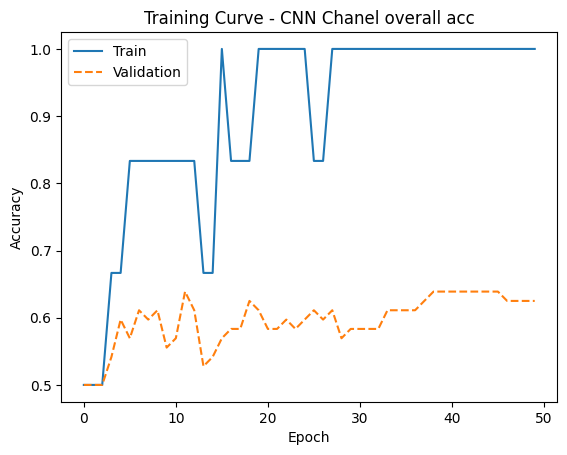

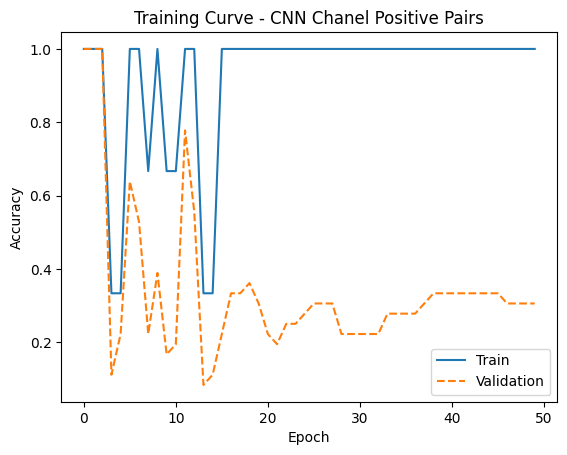

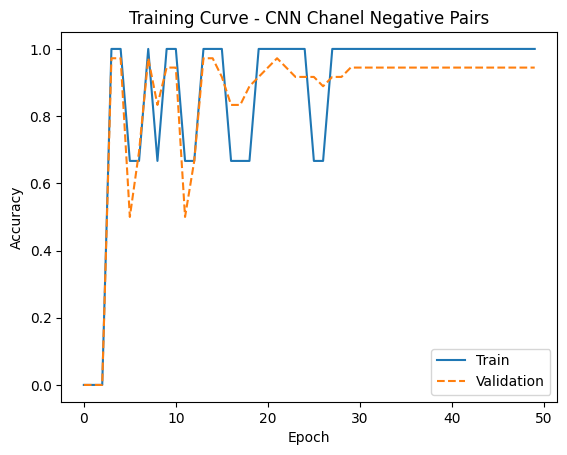

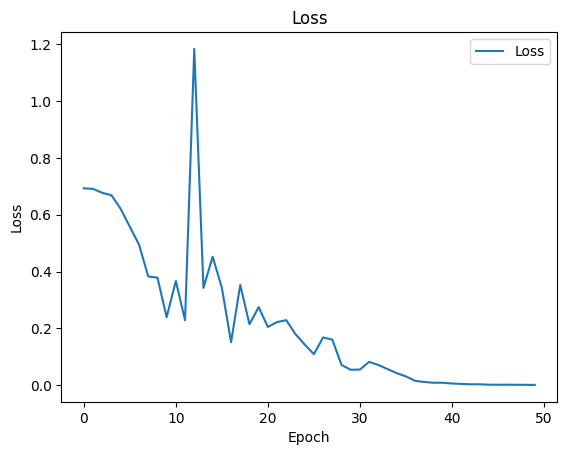

In [ ]:
reload_functions()
import ML_DL_Functions3

# -- cnnChanel Model --
# train_data = 6 images(1 person), validation_data=valid_data, batch_size=6, learning_rate=1e-03, weight_decay=1e-05, epochs=40

model_cnnChanel = ML_DL_Functions3.CNNChannel()
val_acc, train_acc, loss_list = train_model(model=model_cnnChanel, train_data=train_data[:1,:,:,:,:,:], validation_data=valid_data, \
                       batch_size=6, learning_rate=1e-03, weight_decay=1e-05, epochs=50, device="cuda", step_size=1, gamma=0.98, random_comb=True)

val_acc_pos = [val_acc[i][0] for i in range(len(val_acc))]
val_acc_neg = [val_acc[i][1] for i in range(len(val_acc))]

train_acc_pos = [train_acc[i][0] for i in range(len(train_acc))]
train_acc_neg = [train_acc[i][1] for i in range(len(train_acc))]

train_acc_avg = [(train_acc[i][0]+train_acc[i][1])/2 for i in range(len(train_acc))]
val_acc_avg = [(val_acc[i][0]+val_acc[i][1])/2 for i in range(len(val_acc))]

# plotting
def plot_curves(train, valid, name):
  plt.title(f'Training Curve - {name}')
  plt.plot(range(len(train)), train, label="Train")
  plt.plot(range(len(valid)), valid, label="Validation", linestyle='--')
  plt.xlabel("Epoch")
  plt.ylabel("Accuracy")
  plt.legend(loc='best')
  plt.show()

def plot_loss(loss):
  plt.title(f'Loss')
  plt.plot(range(len(loss)), loss, label="Loss")
  plt.xlabel("Epoch")
  plt.ylabel("Loss")
  plt.legend(loc='best')
  plt.show()


plot_curves(train_acc_avg, val_acc_avg, "CNN Chanel overall acc")
plot_curves(train_acc_pos, val_acc_pos, "CNN Chanel Positive Pairs")
plot_curves(train_acc_neg, val_acc_neg, "CNN Chanel Negative Pairs")
plot_loss(loss_list)

lr: 0.00100
Epoch 1 / 50 : [Val Acc pos 0.0% , Val Acc neg 100.0%]
Epoch 1 / 50 : [train Acc pos 0.0% , train Acc neg 100.0%]
Epoch 1 / 50 : [Average Loss: 0.6958]


lr: 0.00098
Epoch 2 / 50 : [Val Acc pos 100.0% , Val Acc neg 0.0%]
Epoch 2 / 50 : [train Acc pos 100.0% , train Acc neg 0.0%]
Epoch 2 / 50 : [Average Loss: 0.8019]


lr: 0.00096
Epoch 3 / 50 : [Val Acc pos 100.0% , Val Acc neg 0.0%]
Epoch 3 / 50 : [train Acc pos 100.0% , train Acc neg 0.0%]
Epoch 3 / 50 : [Average Loss: 0.6918]


lr: 0.00094
Epoch 4 / 50 : [Val Acc pos 100.0% , Val Acc neg 0.0%]
Epoch 4 / 50 : [train Acc pos 100.0% , train Acc neg 0.0%]
Epoch 4 / 50 : [Average Loss: 0.6967]


lr: 0.00092
Epoch 5 / 50 : [Val Acc pos 100.0% , Val Acc neg 0.0%]
Epoch 5 / 50 : [train Acc pos 100.0% , train Acc neg 0.0%]
Epoch 5 / 50 : [Average Loss: 0.6957]


lr: 0.00090
Epoch 6 / 50 : [Val Acc pos 100.0% , Val Acc neg 0.0%]
Epoch 6 / 50 : [train Acc pos 100.0% , train Acc neg 0.0%]
Epoch 6 / 50 : [Average Loss: 0.6951]


lr: 

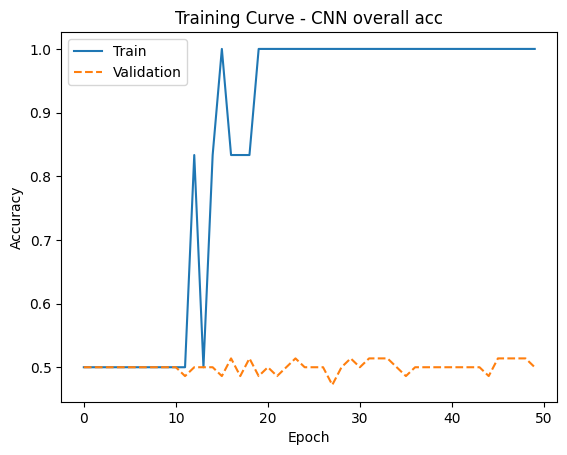

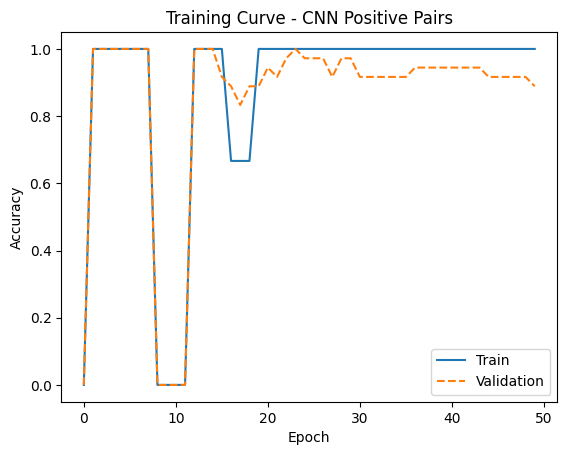

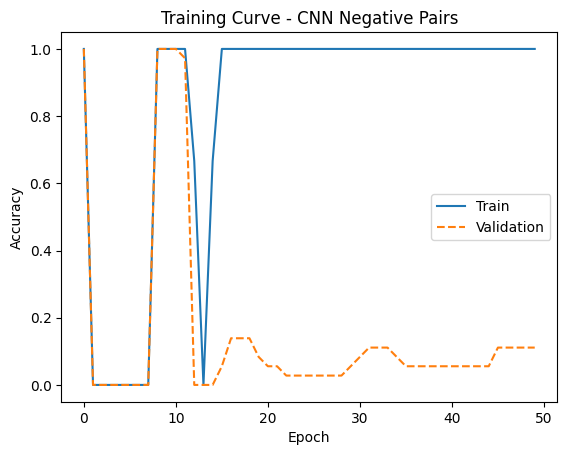

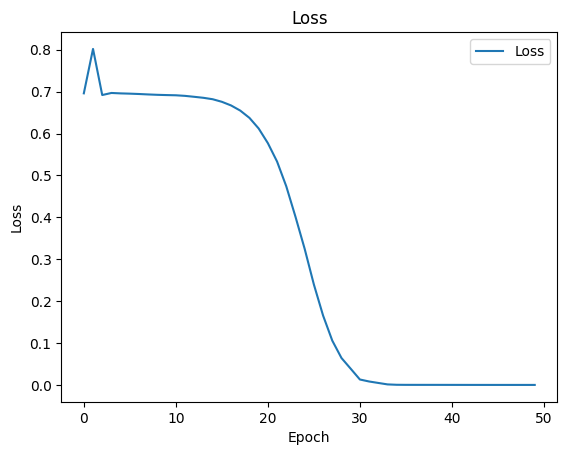

In [ ]:
reload_functions()
import ML_DL_Functions3

# -- CNN First Model --
# train_data = 6 images, validation_data=valid_data, batch_size=6, learning_rate=1e-03, weight_decay=1e-05, epochs=40

model_CNN = ML_DL_Functions3.CNN()
val_acc, train_acc, loss_list = train_model(model=model_CNN, train_data=train_data[:1,:,:,:,:,:], validation_data=valid_data, \
                       batch_size=6, learning_rate=1e-03, weight_decay=1e-05, epochs=50, device="cuda", aug=False, step_size=1, gamma=0.98)

val_acc_pos = [val_acc[i][0] for i in range(len(val_acc))]
val_acc_neg = [val_acc[i][1] for i in range(len(val_acc))]

train_acc_pos = [train_acc[i][0] for i in range(len(train_acc))]
train_acc_neg = [train_acc[i][1] for i in range(len(train_acc))]

train_acc_avg = [(train_acc[i][0]+train_acc[i][1])/2 for i in range(len(train_acc))]
val_acc_avg = [(val_acc[i][0]+val_acc[i][1])/2 for i in range(len(val_acc))]

# plotting
plot_curves(train_acc_avg, val_acc_avg, "CNN overall acc")
plot_curves(train_acc_pos, val_acc_pos, "CNN Positive Pairs")
plot_curves(train_acc_neg, val_acc_neg, "CNN Negative Pairs")
plot_loss(loss_list)

### 3.3 training and saving the optimal model

Train your models from Q2(a) and Q2(b). Change the values of a few
hyperparameters, including the learning rate, batch size, choice of $n$, and
the kernel size. You do not need to check all values for all hyperparameters. Instead, try to make big changes to see how each change affect your scores.
(try to start with finding a resonable learning rate for each network, that start changing the other parameters, the first network might need bigger $n$ and kernel size)

In this section, choose your hyperparameters run the training and save the model in the drive. You should try to save the your **single best** model.
Do this by choosing the  model
architecture that produces the best validation accuracy. For instance,
if your model attained the
best validation accuracy in epoch 12, then the weights at epoch 12 is what you should be using.  Remember to submit the model with your code in the moodle submission.

It is recommended to plot the training curves.

lr: 0.00050
Epoch 1 / 60 : [Val Acc pos 100.0% , Val Acc neg 44.4%]
Epoch 1 / 60 : [train Acc pos 98.0% , train Acc neg 38.9%]
Epoch 1 / 60 : [Average Loss: 0.6344]


lr: 0.00049
Epoch 2 / 60 : [Val Acc pos 50.0% , Val Acc neg 94.4%]
Epoch 2 / 60 : [train Acc pos 59.7% , train Acc neg 93.1%]
Epoch 2 / 60 : [Average Loss: 0.4647]


lr: 0.00048
Epoch 3 / 60 : [Val Acc pos 83.3% , Val Acc neg 75.0%]
Epoch 3 / 60 : [train Acc pos 85.1% , train Acc neg 83.8%]
Epoch 3 / 60 : [Average Loss: 0.3893]


lr: 0.00047
Epoch 4 / 60 : [Val Acc pos 88.9% , Val Acc neg 69.4%]
Epoch 4 / 60 : [train Acc pos 86.5% , train Acc neg 81.8%]
Epoch 4 / 60 : [Average Loss: 0.3763]


lr: 0.00046
Epoch 5 / 60 : [Val Acc pos 97.2% , Val Acc neg 66.7%]
Epoch 5 / 60 : [train Acc pos 95.7% , train Acc neg 71.9%]
Epoch 5 / 60 : [Average Loss: 0.3390]


lr: 0.00045
Epoch 6 / 60 : [Val Acc pos 94.4% , Val Acc neg 69.4%]
Epoch 6 / 60 : [train Acc pos 90.1% , train Acc neg 83.8%]
Epoch 6 / 60 : [Average Loss: 0.3134]


lr:

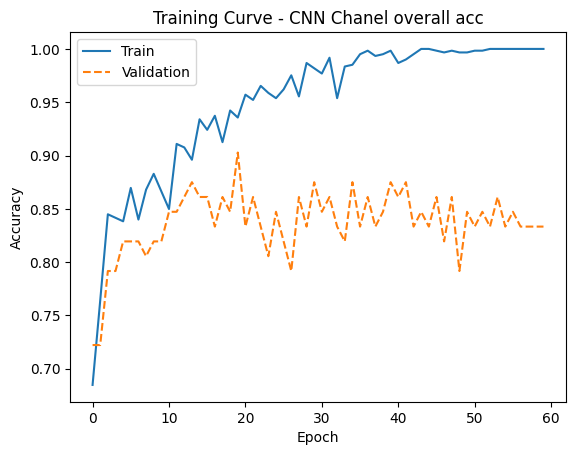

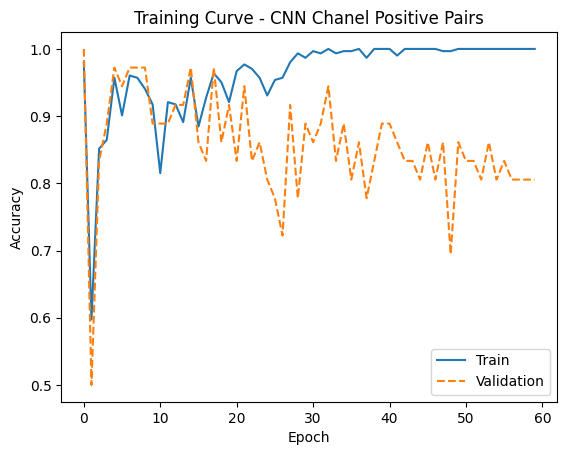

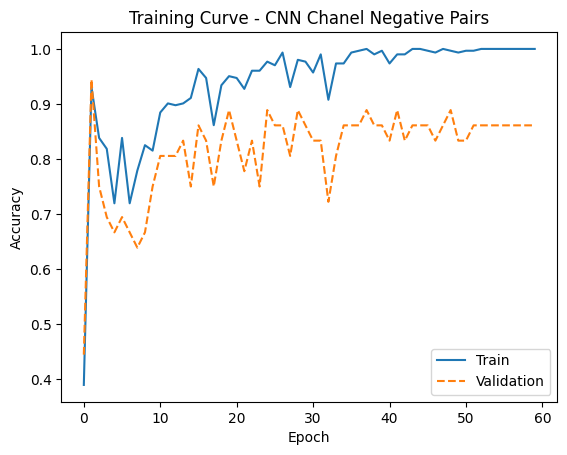

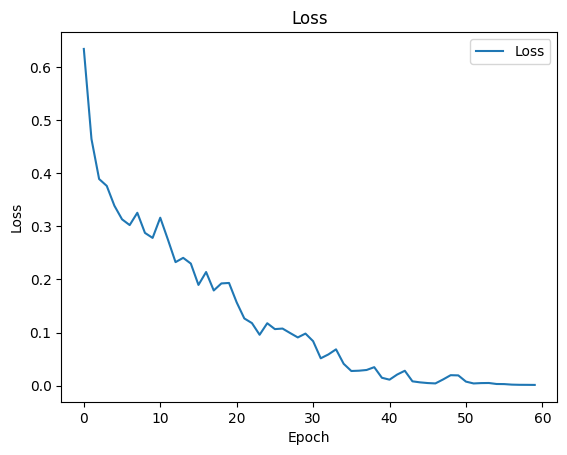

In [ ]:
reload_functions()
import ML_DL_Functions3
CNN_model = ML_DL_Functions3.CNN() # this has to be the blueprint for the model(don't add arguments)
CNNChannel_model = ML_DL_Functions3.CNNChannel() # this has to be the blueprint for the model(don't add arguments)

# -- cnnChanel Model --
# train_data =train_data, validation_data=valid_data, batch_size=100, learning_rate=1e-03, weight_decay=0.0001, epochs=80
val_acc, train_acc, loss_list = train_model(model=CNNChannel_model, train_data=train_data, validation_data=valid_data, \
                       batch_size=30, learning_rate=5e-04, weight_decay=1e-04, epochs=60, model_name="cnnChanel_model", device="cuda", step_size=1, gamma=0.98, random_comb=True)

val_acc_pos = [val_acc[i][0] for i in range(len(val_acc))]
val_acc_neg = [val_acc[i][1] for i in range(len(val_acc))]
train_acc_pos = [train_acc[i][0] for i in range(len(train_acc))]
train_acc_neg = [train_acc[i][1] for i in range(len(train_acc))]

train_acc_avg = [(train_acc[i][0]+train_acc[i][1])/2 for i in range(len(train_acc))]
val_acc_avg = [(val_acc[i][0]+val_acc[i][1])/2 for i in range(len(val_acc))]

# print highest acc echived of the best epoch
best_epoch_idx = val_acc_avg.index(max(val_acc_avg))
print('max overall acc for validation set: %.1f%%' % (100*max(val_acc_avg)))
print(f'best epoch: {best_epoch_idx+1}')
print('positive acc for best epoch validation set: %.1f%%' % (100*val_acc_pos[best_epoch_idx]))
print('negative acc for best epoch validation set: %.1f%%' % (100*val_acc_neg[best_epoch_idx]))

# plotting
plot_curves(train_acc_avg, val_acc_avg, "CNN Chanel overall acc")
plot_curves(train_acc_pos, val_acc_pos, "CNN Chanel Positive Pairs")
plot_curves(train_acc_neg, val_acc_neg, "CNN Chanel Negative Pairs")
plot_loss(loss_list)

lr: 0.00050
Epoch 1 / 60 : [Val Acc pos 100.0% , Val Acc neg 0.0%]
Epoch 1 / 60 : [train Acc pos 100.0% , train Acc neg 0.0%]
Epoch 1 / 60 : [Average Loss: 0.6632]


lr: 0.00049
Epoch 2 / 60 : [Val Acc pos 0.0% , Val Acc neg 100.0%]
Epoch 2 / 60 : [train Acc pos 0.0% , train Acc neg 100.0%]
Epoch 2 / 60 : [Average Loss: 0.6608]


lr: 0.00049
Epoch 3 / 60 : [Val Acc pos 0.0% , Val Acc neg 100.0%]
Epoch 3 / 60 : [train Acc pos 0.0% , train Acc neg 100.0%]
Epoch 3 / 60 : [Average Loss: 0.6603]


lr: 0.00049
Epoch 4 / 60 : [Val Acc pos 0.0% , Val Acc neg 100.0%]
Epoch 4 / 60 : [train Acc pos 0.0% , train Acc neg 100.0%]
Epoch 4 / 60 : [Average Loss: 0.6600]


lr: 0.00048
Epoch 5 / 60 : [Val Acc pos 0.0% , Val Acc neg 100.0%]
Epoch 5 / 60 : [train Acc pos 0.7% , train Acc neg 100.0%]
Epoch 5 / 60 : [Average Loss: 0.6602]


lr: 0.00048
Epoch 6 / 60 : [Val Acc pos 0.0% , Val Acc neg 94.4%]
Epoch 6 / 60 : [train Acc pos 4.0% , train Acc neg 95.4%]
Epoch 6 / 60 : [Average Loss: 0.6597]


lr: 0.

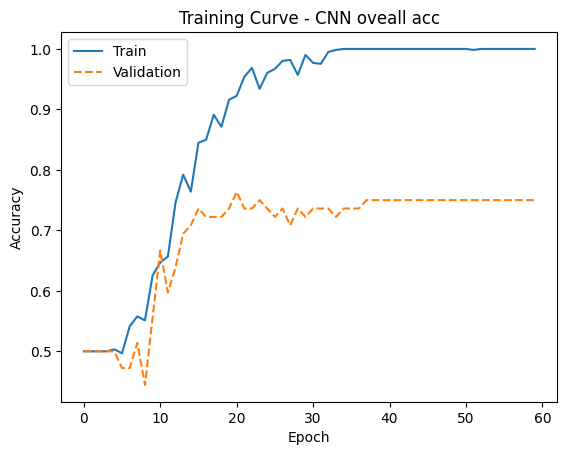

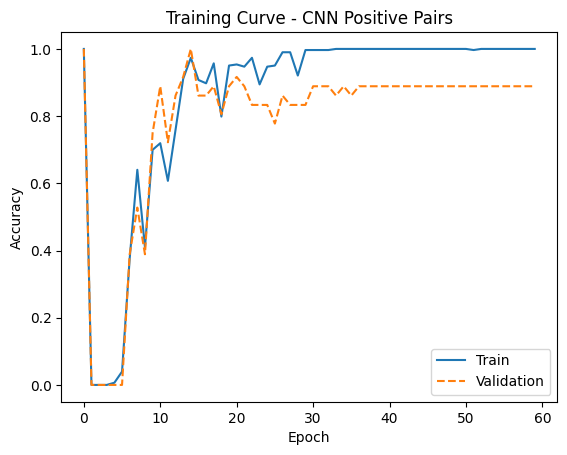

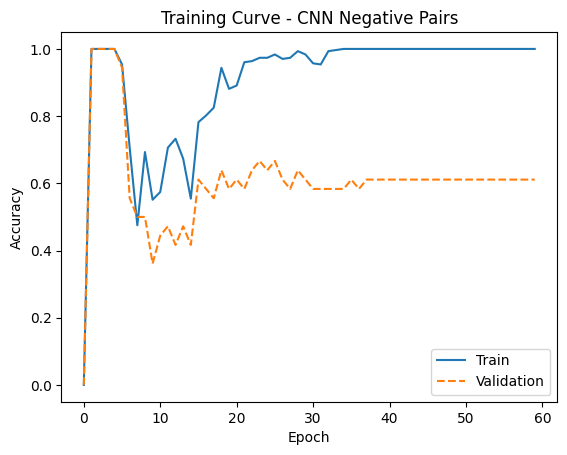

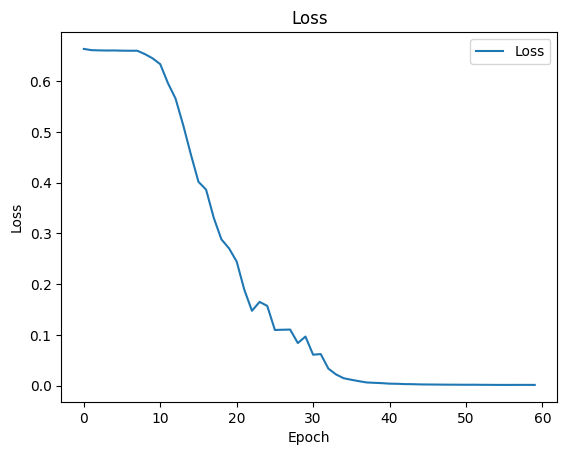

In [ ]:
reload_functions()
import ML_DL_Functions3
# -- CNN Model --
# train_data =train_data, validation_data=valid_data, batch_size=90, learning_rate=1e-03, weight_decay=1e-05, epochs=80
CNN_model = ML_DL_Functions3.CNN() # this has to be the blueprint for the model(don't add arguments)
val_acc, train_acc, loss_list = train_model(model=CNN_model, train_data=train_data, validation_data=valid_data, \
                       batch_size=30, learning_rate=5e-04, weight_decay=1e-04, epochs=60, model_name="CNN_model", device = "cuda", step_size=1, gamma=0.99)

val_acc_pos = [val_acc[i][0] for i in range(len(val_acc))]
val_acc_neg = [val_acc[i][1] for i in range(len(val_acc))]
train_acc_pos = [train_acc[i][0] for i in range(len(train_acc))]
train_acc_neg = [train_acc[i][1] for i in range(len(train_acc))]

train_acc_avg = [(train_acc[i][0]+train_acc[i][1])/2 for i in range(len(train_acc))]
val_acc_avg = [(val_acc[i][0]+val_acc[i][1])/2 for i in range(len(val_acc))]

# print highest acc echived of the best epoch
best_epoch_idx = val_acc_avg.index(max(val_acc_avg))
print('max overall acc for validation set: %.1f%%' % (100*max(val_acc_avg)))
print(f'best epoch: {best_epoch_idx+1}')
print('positive acc for best epoch validation set: %.1f%%' % (100*val_acc_pos[best_epoch_idx]))
print('negative acc for best epoch validation set: %.1f%%' % (100*val_acc_neg[best_epoch_idx]))

# plotting
plot_curves(train_acc_avg, val_acc_avg, "CNN oveall acc")
plot_curves(train_acc_pos, val_acc_pos, "CNN Positive Pairs")
plot_curves(train_acc_neg, val_acc_neg, "CNN Negative Pairs")
plot_loss(loss_list)

I addad next two blocks of code.
each block is another training step, but this time before the train, we loading the best model we achived, and looking to improve it with small increasing learning rate

lr: 0.00001
Epoch: 1, Batch: 1...
Epoch: 1, Batch: 2...
Epoch: 1, Batch: 3...
Epoch: 1, Batch: 4...
Epoch: 1, Batch: 5...
Epoch: 1, Batch: 6...
Epoch: 1, Batch: 7...
Epoch: 1, Batch: 8...
Epoch: 1, Batch: 9...
Epoch: 1, Batch: 10...
Epoch: 1, Batch: 11...
Epoch: 1, Batch: 12...
Epoch: 1, Batch: 13...
Epoch: 1, Batch: 14...
Epoch: 1, Batch: 15...
Epoch: 1, Batch: 16...
Epoch: 1, Batch: 17...
Epoch: 1, Batch: 18...
Epoch: 1, Batch: 19...
Epoch: 1, Batch: 20...
Epoch 1 / 30 : [Val Acc pos 91.7% , Val Acc neg 83.3%]
Epoch 1 / 30 : [train Acc pos 89.1% , train Acc neg 86.1%]
Epoch 1 / 30 : [Average Loss: 0.2950]


lr: 0.00001
Epoch: 2, Batch: 1...
Epoch: 2, Batch: 2...
Epoch: 2, Batch: 3...
Epoch: 2, Batch: 4...
Epoch: 2, Batch: 5...
Epoch: 2, Batch: 6...
Epoch: 2, Batch: 7...
Epoch: 2, Batch: 8...
Epoch: 2, Batch: 9...
Epoch: 2, Batch: 10...
Epoch: 2, Batch: 11...
Epoch: 2, Batch: 12...
Epoch: 2, Batch: 13...
Epoch: 2, Batch: 14...
Epoch: 2, Batch: 15...
Epoch: 2, Batch: 16...
Epoch: 2, Ba

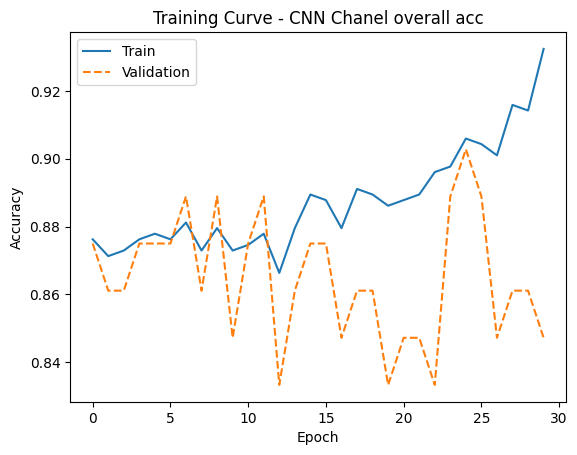

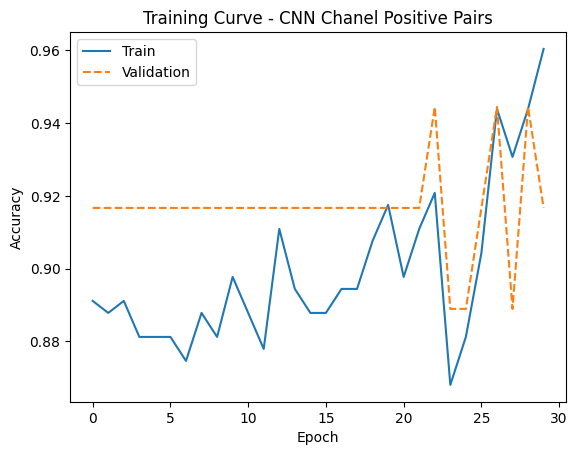

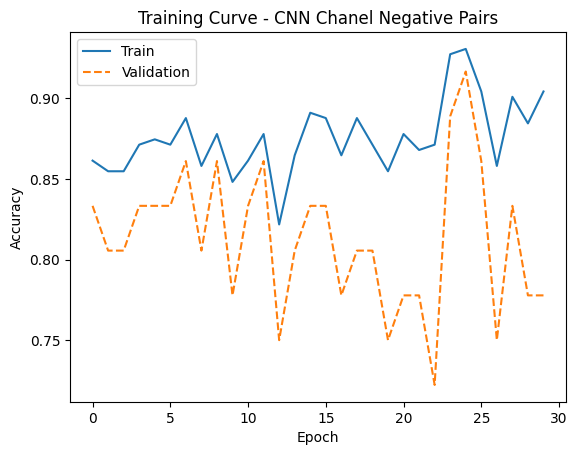

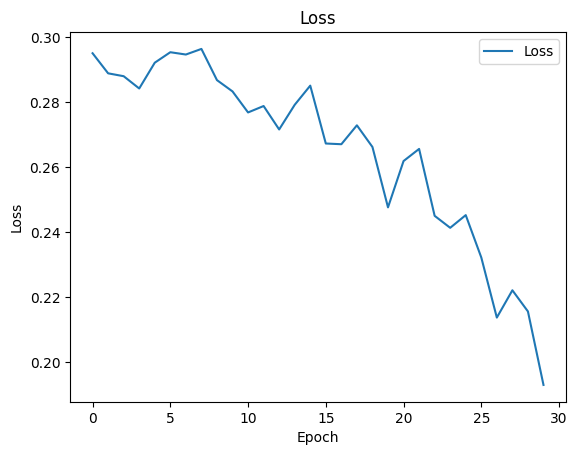

In [ ]:
reload_functions()
import ML_DL_Functions3
checkpoint_path  = drive_path+"checkpoints/" # you can change the path
CNNChannel_model = ML_DL_Functions3.CNNChannel() # this has to be the blueprint for the model(don't add arguments)
CNNChannel_model.load_state_dict(torch.load(checkpoint_path+"cnnChanel_model_best_by_epoch.pk", map_location=torch.device('cpu')))

# -- cnnChanel Model --
# train_data =train_data, validation_data=valid_data, batch_size=100, learning_rate=1e-03, weight_decay=0.0001, epochs=80
val_acc, train_acc, loss_list = train_model(model=CNNChannel_model, train_data=train_data, validation_data=valid_data, \
                       batch_size=30, learning_rate=1e-05, weight_decay=1e-04, epochs=30, model_name="cnnChanel_model", device="cuda", step_size=1, gamma=1.1, random_comb=True)

val_acc_pos = [val_acc[i][0] for i in range(len(val_acc))]
val_acc_neg = [val_acc[i][1] for i in range(len(val_acc))]
train_acc_pos = [train_acc[i][0] for i in range(len(train_acc))]
train_acc_neg = [train_acc[i][1] for i in range(len(train_acc))]

train_acc_avg = [(train_acc[i][0]+train_acc[i][1])/2 for i in range(len(train_acc))]
val_acc_avg = [(val_acc[i][0]+val_acc[i][1])/2 for i in range(len(val_acc))]

# print highest acc echived of the best epoch
best_epoch_idx = val_acc_avg.index(max(val_acc_avg))
print('max overall acc for validation set: %.1f%%' % (100*max(val_acc_avg)))
print(f'best epoch: {best_epoch_idx+1}')
print('positive acc for best epoch validation set: %.1f%%' % (100*val_acc_pos[best_epoch_idx]))
print('negative acc for best epoch validation set: %.1f%%' % (100*val_acc_neg[best_epoch_idx]))

# plotting
plot_curves(train_acc_avg, val_acc_avg, "CNN Chanel overall acc")
plot_curves(train_acc_pos, val_acc_pos, "CNN Chanel Positive Pairs")
plot_curves(train_acc_neg, val_acc_neg, "CNN Chanel Negative Pairs")
plot_loss(loss_list)

lr: 0.00001
Epoch 1 / 40 : [Val Acc pos 94.4% , Val Acc neg 69.4%]
Epoch 1 / 40 : [train Acc pos 97.0% , train Acc neg 94.7%]
Epoch 1 / 40 : [Average Loss: 0.1434]


lr: 0.00001
Epoch 2 / 40 : [Val Acc pos 94.4% , Val Acc neg 63.9%]
Epoch 2 / 40 : [train Acc pos 97.7% , train Acc neg 94.7%]
Epoch 2 / 40 : [Average Loss: 0.1306]


lr: 0.00001
Epoch 3 / 40 : [Val Acc pos 97.2% , Val Acc neg 61.1%]
Epoch 3 / 40 : [train Acc pos 98.0% , train Acc neg 94.4%]
Epoch 3 / 40 : [Average Loss: 0.1192]


lr: 0.00001
Epoch 4 / 40 : [Val Acc pos 97.2% , Val Acc neg 61.1%]
Epoch 4 / 40 : [train Acc pos 98.7% , train Acc neg 95.0%]
Epoch 4 / 40 : [Average Loss: 0.1121]


lr: 0.00001
Epoch 5 / 40 : [Val Acc pos 97.2% , Val Acc neg 66.7%]
Epoch 5 / 40 : [train Acc pos 98.7% , train Acc neg 96.0%]
Epoch 5 / 40 : [Average Loss: 0.1043]


lr: 0.00002
Epoch 6 / 40 : [Val Acc pos 94.4% , Val Acc neg 66.7%]
Epoch 6 / 40 : [train Acc pos 98.7% , train Acc neg 96.4%]
Epoch 6 / 40 : [Average Loss: 0.0969]


lr: 

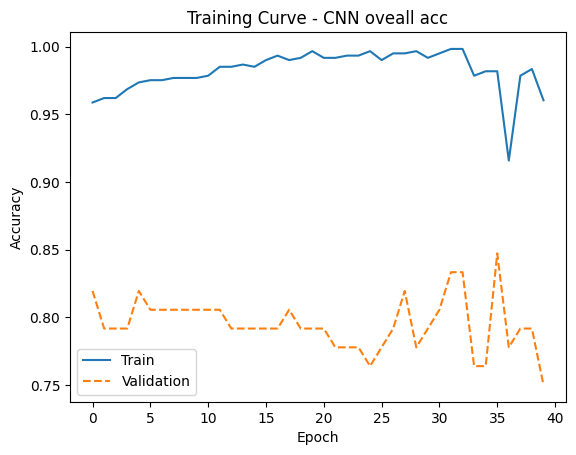

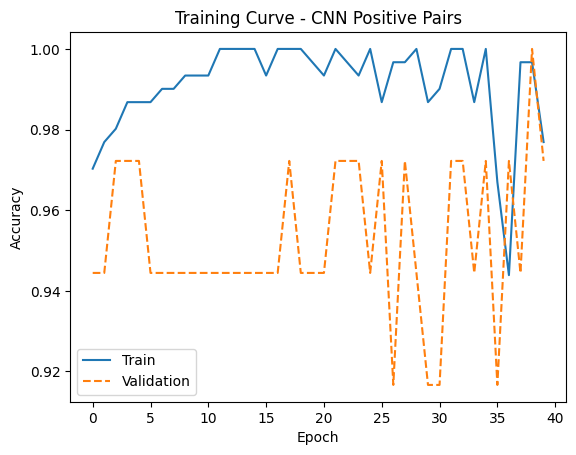

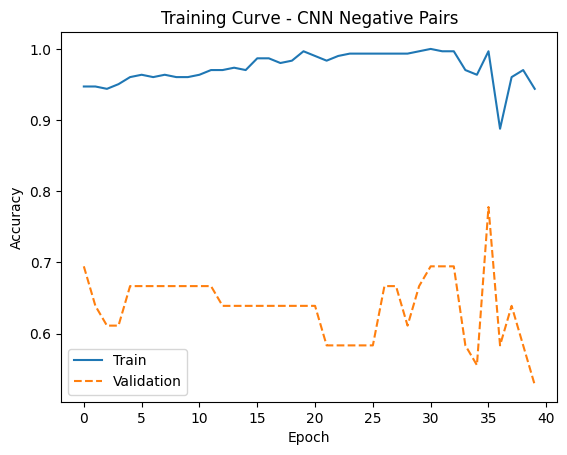

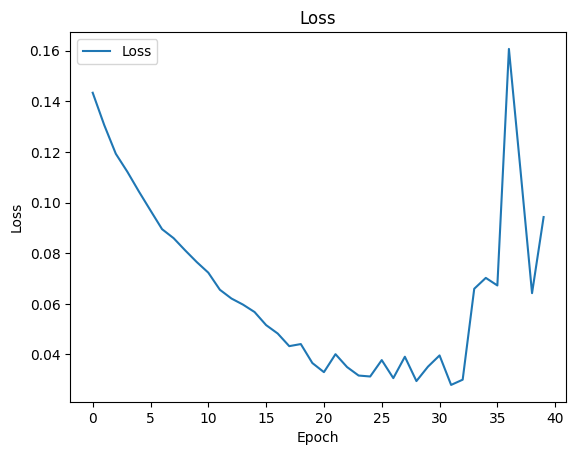

In [ ]:
# -- CNN Model --
# train_data =train_data, validation_data=valid_data, batch_size=90, learning_rate=1e-03, weight_decay=1e-05, epochs=80
CNN_model = ML_DL_Functions3.CNN() # this has to be the blueprint for the model(don't add arguments)
CNN_model.load_state_dict(torch.load(checkpoint_path+"CNN_model_best_by_epoch.pk", map_location=torch.device('cpu')))
val_acc, train_acc, loss_list = train_model(model=CNN_model, train_data=train_data, validation_data=valid_data, \
                       batch_size=30, learning_rate=1e-05, weight_decay=1e-04, epochs=40, model_name="CNN_model", device = "cuda", step_size=1, gamma=1.1)

val_acc_pos = [val_acc[i][0] for i in range(len(val_acc))]
val_acc_neg = [val_acc[i][1] for i in range(len(val_acc))]
train_acc_pos = [train_acc[i][0] for i in range(len(train_acc))]
train_acc_neg = [train_acc[i][1] for i in range(len(train_acc))]

train_acc_avg = [(train_acc[i][0]+train_acc[i][1])/2 for i in range(len(train_acc))]
val_acc_avg = [(val_acc[i][0]+val_acc[i][1])/2 for i in range(len(val_acc))]

# print highest acc echived of the best epoch
best_epoch_idx = val_acc_avg.index(max(val_acc_avg))
print('max overall acc for validation set: %.1f%%' % (100*max(val_acc_avg)))
print(f'best epoch: {best_epoch_idx+1}')
print('positive acc for best epoch validation set: %.1f%%' % (100*val_acc_pos[best_epoch_idx]))
print('negative acc for best epoch validation set: %.1f%%' % (100*val_acc_neg[best_epoch_idx]))

# plotting
plot_curves(train_acc_avg, val_acc_avg, "CNN oveall acc")
plot_curves(train_acc_pos, val_acc_pos, "CNN Positive Pairs")
plot_curves(train_acc_neg, val_acc_neg, "CNN Negative Pairs")
plot_loss(loss_list)

In [ ]:
# save teh best models
CNN_model = ML_DL_Functions3.CNN()
CNNChannel_model = ML_DL_Functions3.CNNChannel()
checkpoint_path  = drive_path+"checkpoints/"
CNN_model.load_state_dict(torch.load(drive_path+"best_CNN_model.pk"))
CNNChannel_model.load_state_dict(torch.load(drive_path+"best_CNNChannel_model.pk", map_location=torch.device('cpu')))
torch.save(CNN_model.state_dict(), checkpoint_path+"best_CNN_model.pk") # Do not change the name of the checkpoint file
torch.save(CNNChannel_model.state_dict(), checkpoint_path+"best_CNNChannel_model.pk") # Do not change the name of the checkpoint file

## 4. Testing




### 4.1. Accuracies

The test accuracy of the **single best** model, separately for the two test sets. We choose the model architecture that produces the best validation accuracy. For instance, if the model attained the best validation accuracy in epoch 12, then the weights at epoch 12 represent the best model achieved.

In [ ]:
reload_functions()
import ML_DL_Functions3
# Write your code here.
best_model = ML_DL_Functions3.CNNChannel()
best_model.load_state_dict(torch.load(checkpoint_path+"best_CNNChannel_model.pk"))

best_model.eval()
m_pos_acc, m_neg_acc = get_accuracy(best_model, test_m_data)
w_pos_acc, w_neg_acc = get_accuracy(best_model, test_w_data)

m_false_positive = 1 - m_pos_acc
m_false_negative = 1 - m_neg_acc

w_false_positive = 1 - w_pos_acc
w_false_negative = 1 - w_neg_acc

t_pos_acc, t_neg_acc = get_accuracy(best_model, test_m_data)
v_pos_acc, v_neg_acc = get_accuracy(best_model, test_w_data)


print('On the Man test data set:')
print('the model preformed %.1f%% acc overall' % ( 100*(m_pos_acc + m_neg_acc)/2 ))
print('Positive pairs acc: %.1f%% \nNegative pairs acc: %.1f%%\n' % (m_pos_acc*100, m_neg_acc*100))
print('False Positive pairs acc: %.1f%% \nFlase Negative pairs acc: %.1f%%\n' % (m_false_positive*100, m_false_negative*100))

print('On the Woman test data set:')
print('the model preformed %.1f%% acc overall' % ( 100*(w_pos_acc + w_neg_acc)/2 ))
print('positive pairs acc: %.1f%% \nnegative pairs acc: %.1f%%\n' % (w_pos_acc*100, w_neg_acc*100))
print('False Positive pairs acc: %.1f%% \nFlase Negative pairs acc: %.1f%%\n' % (w_false_positive*100, w_false_negative*100))


print('On the validation test data set:')
print('the model preformed %.1f%% acc overall' % ( 100*(v_pos_acc + v_neg_acc)/2 ))
print('positive pairs acc: %.1f%% \nnegative pairs acc: %.1f%%\n' % (v_pos_acc*100, v_neg_acc*100))


On the Man test data set:
the model preformed 88.3% acc overall
Positive pairs acc: 83.3% 
Negative pairs acc: 93.3%

False Positive pairs acc: 16.7% 
Flase Negative pairs acc: 6.7%

On the Woman test data set:
the model preformed 91.7% acc overall
positive pairs acc: 90.0% 
negative pairs acc: 93.3%

False Positive pairs acc: 10.0% 
Flase Negative pairs acc: 6.7%

On the validation test data set:
the model preformed 91.7% acc overall
positive pairs acc: 90.0% 
negative pairs acc: 93.3%



### 4.2 Men's Shoes Results




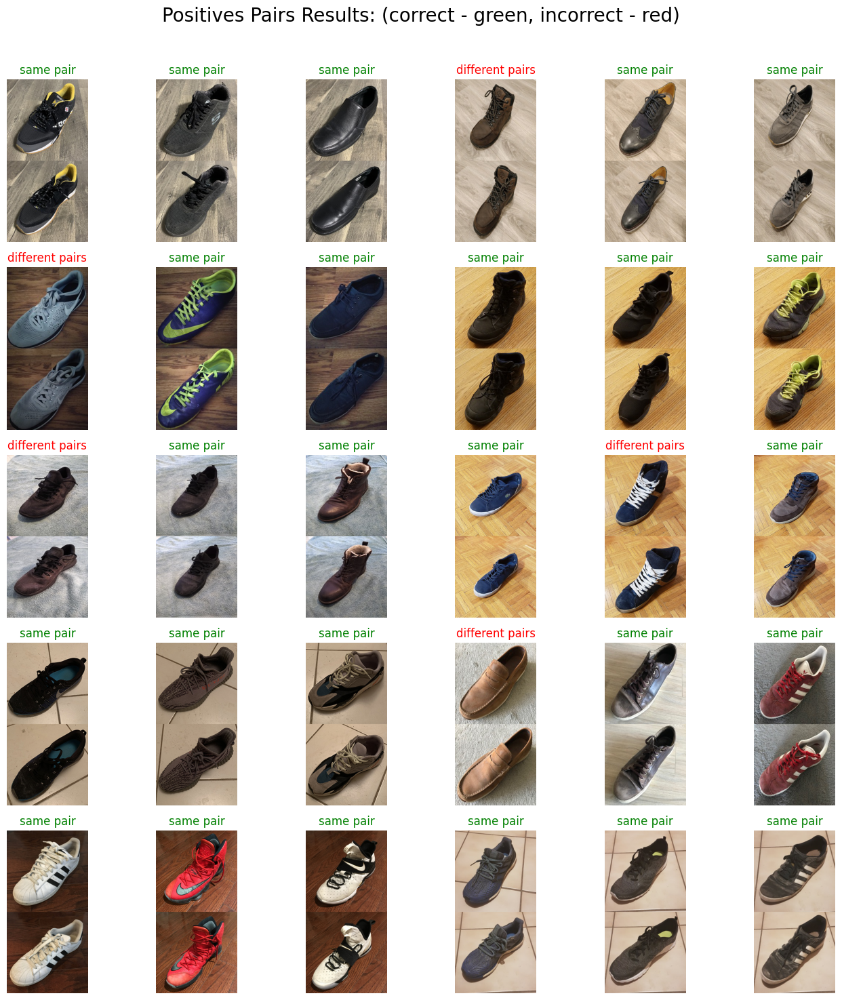

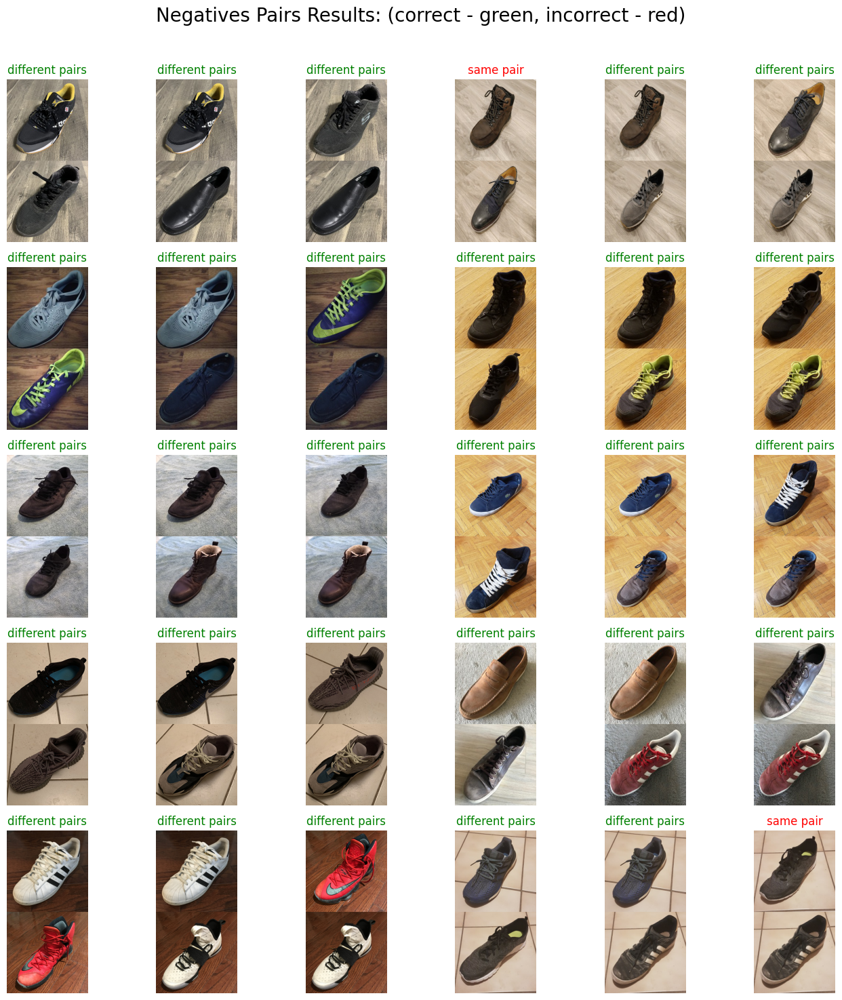

In [ ]:
def Display_Classification_Results(test_set):

  data_pos = generate_same_pair(test_set)
  data_neg = generate_different_pair(test_set)

  # data of positives pairs
  xs = torch.Tensor(data_pos).permute(0,3,1,2)
  xs = xs.to('cpu')
  zs = best_model(xs)
  pred = zs.max(1)[1] # get the index of the max logit
  #pred = zs.max(1, keepdim=True)[1] # get the index of the max logit
  pred = pred.detach().cpu().numpy()
  correct_pos_pairs = data_pos[pred == 1]
  incorrect_pos_pairs= data_pos[pred == 0]

  fig, axes = plt.subplots(5, 6, figsize=(14, 14))
  axes = axes.flatten()
  count = -1
  for i in range(5):
    for j in range(3):
      for k in range(2):
        count = count + 1
        if count == 30:
          break
        axes[count].imshow(data_pos[count] + 0.5)
        axes[count].axis('off')
        if pred[count] == 1:
          axes[count].set_title("same pair", color='green')
        else:
          axes[count].set_title("different pairs", color='red')

  plt.tight_layout()
  plt.suptitle('Positives Pairs Results: (correct - green, incorrect - red)', y=1.05, fontsize=20)
  plt.show()

  print("\n\n")
  # data of negatives pairs
  xs = torch.Tensor(data_neg).permute(0,3,1,2)
  xs = xs.to('cpu')
  zs = best_model(xs)
  pred = zs.max(1)[1] # get the index of the max logit
  #pred = zs.max(1, keepdim=True)[1] # get the index of the max logit
  pred = pred.detach().cpu().numpy()
  correct_pos_pairs = data_pos[pred == 0]
  incorrect_pos_pairs= data_pos[pred == 1]

  fig, axes = plt.subplots(5, 6, figsize=(14, 14))
  axes = axes.flatten()
  count = -1
  for i in range(5):
    for j in range(3):
      for k in range(2):
        count = count + 1
        if count == 30:
          break
        axes[count].imshow(data_neg[count] + 0.5)
        axes[count].axis('off')
        if pred[count] == 0:
          axes[count].set_title("different pairs", color='green')
        else:
          axes[count].set_title("same pair", color='red')

  plt.tight_layout()
  plt.suptitle('Negatives Pairs Results: (correct - green, incorrect - red)', y=1.05, fontsize=20)
  plt.show()

Display_Classification_Results(test_m_data)


### 4.2 Women's Shoes Results




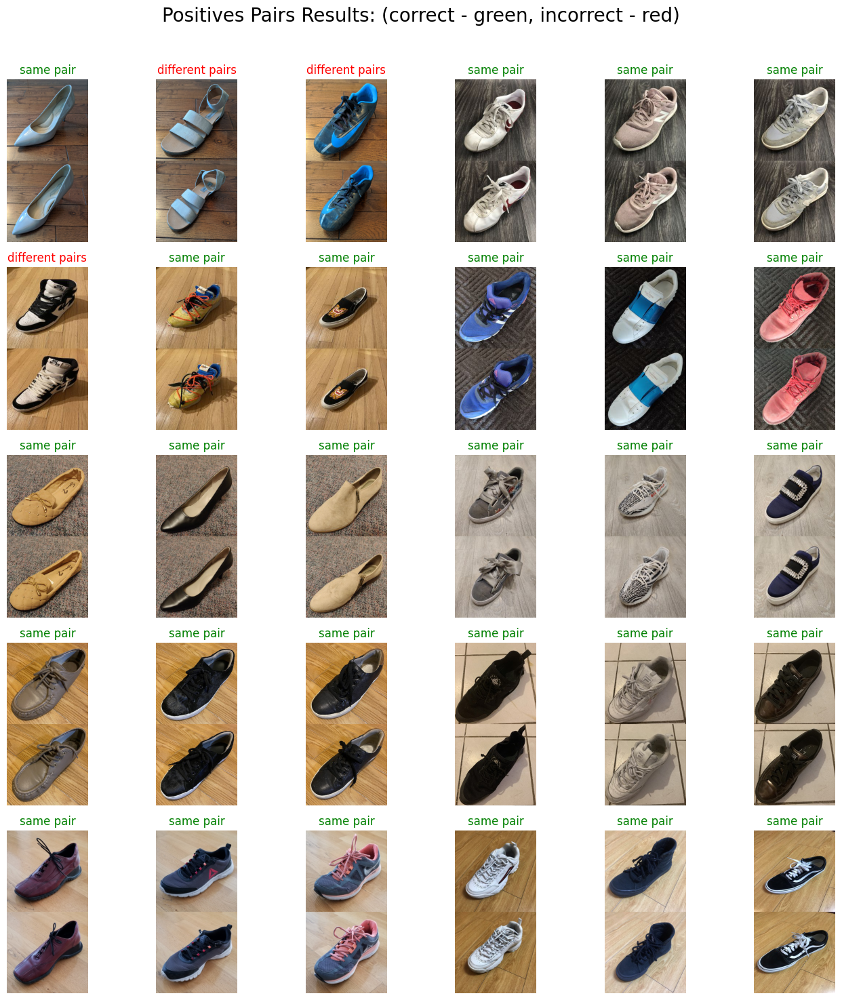

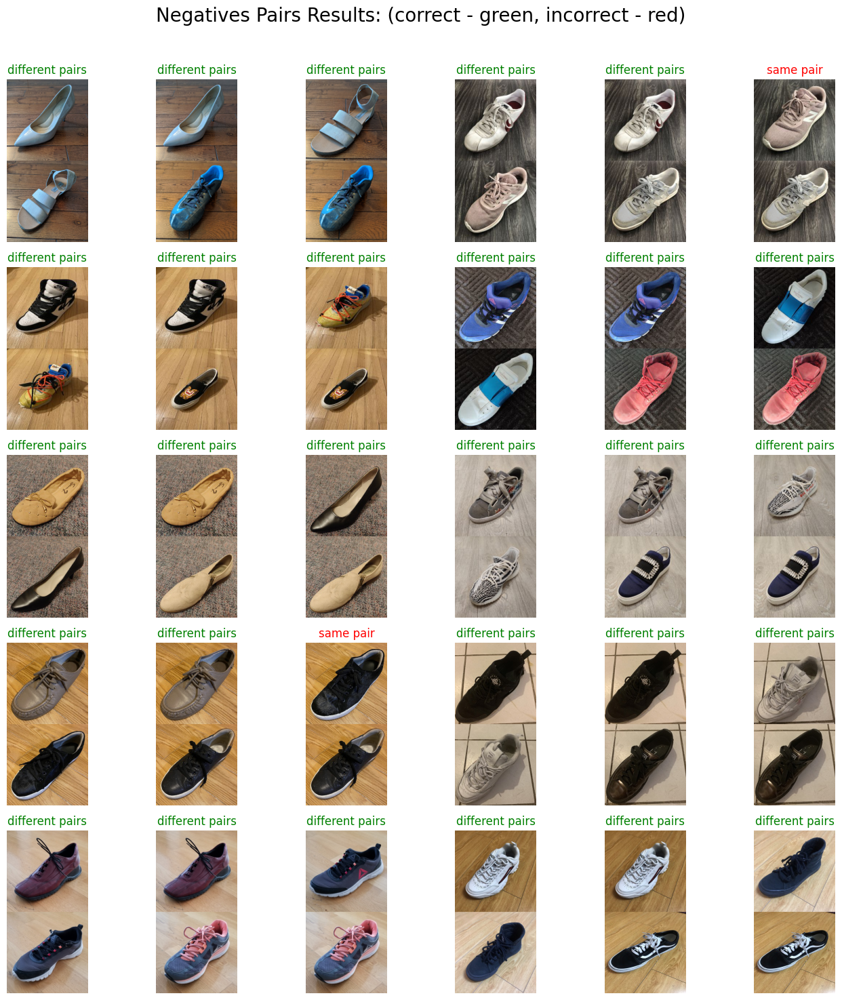

In [ ]:
# Write your code here.
Display_Classification_Results(test_w_data)